In [24]:
import os
import PIL.Image
from PIL import Image
from typing import Dict, Set, Tuple, List, Union
import argparse
import random
import supervision as sv
import json
import numpy as np
import torch
import pandas as pd
import cv2
from typing import Optional

from mmengine.config import Config
from mmengine.dataset import Compose
from mmengine.runner import Runner
from mmengine.runner.amp import autocast
from mmyolo.registry import RUNNERS

from scipy import integrate
from scipy.special import expit as sigmoid
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import precision_recall_curve

import torch
import torchvision
from torchvision.ops import nms
import torch.nn.functional as F
import torch.nn as nn
from transformers import (AutoTokenizer, CLIPTextModelWithProjection, CLIPVisionModelWithProjection, AutoProcessor)

In [2]:
device = torch.device("cuda:0")

In [3]:
def load_model_eval(weights, config):
    checkpoint = torch.load(weights)
    del checkpoint['state_dict']['embeddings']
    cfg = Config.fromfile(config)
    cfg.work_dir = "."

    runner = Runner.from_cfg(cfg)
    runner.model.load_state_dict(checkpoint['state_dict'], strict = False)
    pipeline = cfg.val_dataloader.dataset.pipeline
    runner.pipeline = Compose(pipeline)
    runner.model.eval()
    return runner

def load_model_train(weights, config):
    cfg = Config.fromfile(config)
    
    if weights != None:
        cfg.load_from = weights
    cfg.work_dir = "."

    runner = Runner.from_cfg(cfg)
    pipeline = cfg.train_dataloader.dataset.pipeline
    runner.pipeline = Compose(pipeline)  
    return runner


# error analysis 

In [49]:
bounding_box_annotator_pred = sv.BoundingBoxAnnotator(color=sv.Color.BLUE)
bounding_box_annotator_true = sv.BoundingBoxAnnotator(color=sv.Color.GREEN)
label_annotator = sv.LabelAnnotator(text_position=sv.Position.CENTER)

def add_legend(image, legend_info, position=(10, 10), spacing=30, box_size=20, font_scale = 0.8, thickness=2):
    x, y = position
    for label, color in legend_info:
        cv2.rectangle(image, (x, y), (x + box_size, y + box_size), color, -1)
        cv2.putText(image, label, (x + box_size + 5, y + box_size - 5), cv2.FONT_HERSHEY_SIMPLEX, font_scale, color, thickness, 1)
        y += spacing
    return image

def run_image(
        runner,
        input_path,
        im_name,
        ann,
        max_num_boxes=300,
        score_thr=0.00001,
        nms_thr=0.5,
        output_image="output.png",
):
    input_image = os.path.join(input_path, im_name)

    data_info = runner.pipeline(dict(img_id=0, img_path=input_image))

    data_batch = dict(
        inputs=data_info["inputs"].unsqueeze(0),
        data_samples=[data_info["data_samples"]],
    )

    with torch.cuda.amp.autocast(enabled=False), torch.no_grad():
        output = runner.model.test_step(data_batch)[0]
        pred_instances = output.pred_instances
    

    keep_idxs = nms(pred_instances.bboxes, pred_instances.scores, iou_threshold=nms_thr)
    pred_instances = pred_instances[keep_idxs]
    pred_instances = pred_instances[pred_instances.scores.float() > score_thr]

    if len(pred_instances.scores) > max_num_boxes:
        indices = pred_instances.scores.float().topk(max_num_boxes)[1]
        pred_instances = pred_instances[indices]
    output.pred_instances = pred_instances

    pred_instances = pred_instances.cpu().numpy()
    detections = sv.Detections(
        xyxy=pred_instances['bboxes'],
        class_id=pred_instances['labels'],
        confidence=pred_instances['scores']
    )
    labels = [
        f"{class_id} {confidence:0.2f}"
        for class_id, confidence
        in zip(detections.class_id, detections.confidence)
    ]

    image = PIL.Image.open(input_image)
    svimage = np.array(image)
    svimage = bounding_box_annotator_pred.annotate(svimage, detections)
    svimage = label_annotator.annotate(svimage, detections, labels)

    image_id = [i["id"] for i in ann["images"] if i["file_name"] == im_name][0]
    true_bboxes = np.array([i["bbox"] for i in ann["annotations"] if i["image_id"] == image_id])

    if len(true_bboxes) > 0:
        true_bboxes[:,2] += true_bboxes[:,0]
        true_bboxes[:,3] += true_bboxes[:,1]

        true_detections = sv.Detections(
            xyxy=true_bboxes,
            class_id=np.zeros(len(true_bboxes))
        )

        svimage = bounding_box_annotator_true.annotate(svimage, true_detections)

    # Add legend to the image
    legend_info = [("Predictions", (255, 0, 0)), ("Ground Truth", (0, 255, 0))]
    svimage = add_legend(svimage, legend_info)

    return svimage[:, :, ::-1], pred_instances, true_bboxes

def training_history(json_path):
    train_hist = []
    with open((json_path + '/vis_data/scalars.json'), 'r') as file:
        for line in file:
            train_hist.append(json.loads(line))

    loss_cls = []
    loss_bbox= []
    loss_dfl = []

    mAP = []
    mAP_50 = []
    mAP_75 = []

    for i in train_hist:
        try:
            loss_cls.append(i['loss_cls'])
            loss_bbox.append(i['loss_bbox'])
            loss_dfl.append(i['loss_dfl'])
        except:
            pass
        try:
            mAP.append(i['coco/bbox_mAP'])
            mAP_50.append(i['coco/bbox_mAP_50'])
            mAP_75.append(i['coco/bbox_mAP_75'])
        except:
            pass
        
    return loss_cls, loss_bbox, loss_dfl, mAP, mAP_50, mAP_75


def plot_training_loss(swith_epoch, num_epoch, steps_per_epoch):

    total_steps = steps_per_epoch * num_epoch

    # Modify the loss_records to represent training steps
    epochs = np.linspace(1, total_steps, num_epoch)

 
    switch_step = swith_epoch * steps_per_epoch  

    plt.figure(figsize=(12, 6))

    # Plot and label the training and validation loss values
    plt.plot(epochs, loss_cls, label='Classification Loss')
    plt.plot(epochs, loss_bbox, label='Bounding Box Loss')
    plt.plot(epochs, loss_dfl, label='Dfl Loss')

    plt.axvline(x=switch_step, color='red', linestyle='--', label='Switch Pipeline')

    # Add in a title and axes labels
    plt.title('Cls - BBox - Dfl Loss')
    plt.xlabel('Training Steps')
    plt.ylabel('Loss')
    plt.ylim(0,15)
    plt.xlim(0, total_steps)

    # Display the plot
    plt.legend(loc='best')
    

def plot_images_grid(
    images: List[np.ndarray],
    grid_size: Tuple[int, int],
    titles: Optional[List[str]] = None,
    size: Tuple[int, int] = (12, 12),
    cmap: Optional[str] = "gray",
) -> None:
    """
    Plots images in a grid using matplotlib.

    Args:
       images (List[np.ndarray]): A list of images as numpy arrays.
       grid_size (Tuple[int, int]): A tuple specifying the number
            of rows and columns for the grid.
       titles (Optional[List[str]]): A list of titles for each image.
            Defaults to None.
       size (Tuple[int, int]): A tuple specifying the width and
            height of the entire plot in inches.
       cmap (str): the colormap to use for single channel images.

    Raises:
       ValueError: If the number of images exceeds the grid size.

    Examples:
        ```python
        import cv2
        import supervision as sv

        image1 = cv2.imread("path/to/image1.jpg")
        image2 = cv2.imread("path/to/image2.jpg")
        image3 = cv2.imread("path/to/image3.jpg")

        images = [image1, image2, image3]
        titles = ["Image 1", "Image 2", "Image 3"]

        %matplotlib inline
        plot_images_grid(images, grid_size=(2, 2), titles=titles, size=(16, 16))
        ```
    """
    nrows, ncols = grid_size

    if len(images) > nrows * ncols:
        raise ValueError(
            "The number of images exceeds the grid size. Please increase the grid size"
            " or reduce the number of images."
        )

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=size)

    for idx, ax in enumerate(axes.flat):
        if idx < len(images):
            if images[idx].ndim == 2:
                ax.imshow(images[idx], cmap=cmap)
            else:
                ax.imshow(cv2.cvtColor(images[idx], cv2.COLOR_BGR2RGB))

            if titles is not None and idx < len(titles):
                ax.set_title(titles[idx])

        ax.axis("off")
    plt.show()
    
def plot_sample_detections(ann_path, img_path, score_threshold, title):
    f=open(ann_path)
    ann = json.load(f)
    x = random.randint(0, 97)
    im_names = os.listdir(img_path)[x:x+6]
    detected_images=[]
    for im in im_names:
        detected_images.append(run_image(runner,img_path,im,ann,score_thr = score_threshold)[0])
    print(title)
    print("---------------------------------------------------------------")
    plot_images_grid(detected_images, grid_size=(3, 2), size=(20, 20))
    
    
def collect_true_and_pred(pred_instances, true_bboxes, iou_threshold=0.5):
    """
    Collect predicted scores and true binary labels for precision-recall calculation.
    """
    pred_bboxes = pred_instances['bboxes']
    pred_scores = pred_instances['scores']
    
    true_labels = []
    pred_scores_for_pr = []

    for pred_bbox, score in zip(pred_bboxes, pred_scores):
        # Calculate IoU with ground truth
        iou_scores = compute_iou(pred_bbox, true_bboxes)  # Function to compute IoU
        max_iou = max(iou_scores)  # Get the highest IoU
        
        if max_iou >= iou_threshold:
            true_labels.append(1)  # True positive (match)
        else:
            true_labels.append(0)  # False positive (no match)
        
        pred_scores_for_pr.append(score)  # Predicted score
    
    return true_labels, pred_scores_for_pr

def compute_iou(pred_bbox, true_bboxes):
    """
    Compute the Intersection over Union (IoU) for the predicted bbox and all ground truth bboxes.
    Args:
    - pred_bbox: (x1, y1, x2, y2) format of the predicted bounding box.
    - true_bboxes: Array of ground truth bounding boxes in (x1, y1, x2, y2) format.

    Returns:
    - IoU scores between the predicted bbox and all ground truth bboxes.
    """
    iou_scores = []
    
    for true_bbox in true_bboxes:
        # Calculate intersection coordinates
        x1 = max(pred_bbox[0], true_bbox[0])
        y1 = max(pred_bbox[1], true_bbox[1])
        x2 = min(pred_bbox[2], true_bbox[2])
        y2 = min(pred_bbox[3], true_bbox[3])
        
        # Check if there is an intersection
        if x2 > x1 and y2 > y1:
            # Compute intersection area
            intersection_area = (x2 - x1) * (y2 - y1)
            
            # Compute areas of both the predicted and ground truth boxes
            pred_area = (pred_bbox[2] - pred_bbox[0]) * (pred_bbox[3] - pred_bbox[1])
            true_area = (true_bbox[2] - true_bbox[0]) * (true_bbox[3] - true_bbox[1])
            
            # Compute IoU
            iou = intersection_area / float(pred_area + true_area - intersection_area)
            iou_scores.append(iou)
        else:
            # No intersection, append 0 IoU
            iou_scores.append(0.0)
    
    return iou_scores

def plot_precision_recall_curve(runner, input_path, ann_path, iou_threshold=0.5, max_num_boxes=300, score_thr_range=np.linspace(0,1,41)):
    all_true_labels = []
    all_pred_scores = []
    all_precisions = []
    all_recalls = []
    
    
    f=open(ann_path)
    ann = json.load(f)

    # Loop over each image in the annotation
    for im_name in ann["images"]:
        #true_bboxes = np.array([i["bbox"] for i in ann["annotations"] if i["image_id"] == im_name["id"]])

        # Run the inference for the image
        im, pred_instances, true_bboxes = run_image(runner, input_path, im_name["file_name"], ann, max_num_boxes=max_num_boxes, score_thr=0.001)

        # Collect true labels and predicted scores for precision-recall calculation
        true_labels, pred_scores_for_pr = collect_true_and_pred(pred_instances, true_bboxes, iou_threshold)

        all_true_labels.extend(true_labels)
        all_pred_scores.extend(pred_scores_for_pr)
        
        

    precision, recall, thresholds = precision_recall_curve(all_true_labels, all_pred_scores)
       
    f1_scores = 2 * (precision * recall) / (precision + recall)

    # Find the index of the best threshold (maximum F1 score)
    best_threshold_index = np.argmax(f1_scores)
    best_threshold = thresholds[best_threshold_index]

    # Plot Precision-Recall curve
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, marker='.', label="Precision-Recall Curve")
    plt.scatter(recall[best_threshold_index], precision[best_threshold_index], color='red', label=f'Best Threshold = {best_threshold:.2f}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.grid(True)
    plt.legend(loc='best')
    plt.show()

    # Output the best threshold and corresponding F1 score
    print(f"Best Confidence Threshold: {best_threshold:.2f}")
    print(f"Best F1 Score: {f1_scores[best_threshold_index]:.2f}")

# TEXT QUERY

In [83]:
runner = load_model_eval("pretrained_models/yolo_world_v2_l_vlpan_bn_sgd_1e-3_40e_8gpus_finetune_coco_ep80-e1288152.pth", "MLCV_configs/tuning_yolo_world/mlcv_yolo_world_zeroshot_config.py")

11/10 12:44:55 - mmengine - WARNING - Failed to search registry with scope "mmyolo" in the "log_processor" registry tree. As a workaround, the current "log_processor" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmyolo" is a correct scope, or whether the registry is initialized.
11/10 12:44:55 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.19 (default, Mar 20 2024, 19:58:24) [GCC 11.2.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1895284612
    GPU 0: NVIDIA GeForce RTX 2070 SUPER
    GPU 1: NVIDIA GeForce GTX 1080
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.2, V11.2.142
    GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.2) 9.4.0
    PyTorch: 1.11.0+cu113
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Int

11/10 12:44:58 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
11/10 12:44:58 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
after_load_checkpoint:
(49          ) EMAHook                            
 -------------------- 
before_train:
(9           ) YOLOv5ParamSchedulerHook           
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHo

In [9]:
runner.test()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


11/09 08:53:42 - mmengine - INFO - Epoch(test) [ 50/501]    eta: 0:00:22  time: 0.0502  data_time: 0.0027  memory: 2556  
11/09 08:53:43 - mmengine - INFO - Epoch(test) [100/501]    eta: 0:00:15  time: 0.0283  data_time: 0.0002  memory: 488  
11/09 08:53:45 - mmengine - INFO - Epoch(test) [150/501]    eta: 0:00:12  time: 0.0284  data_time: 0.0002  memory: 488  
11/09 08:53:46 - mmengine - INFO - Epoch(test) [200/501]    eta: 0:00:10  time: 0.0286  data_time: 0.0002  memory: 488  
11/09 08:53:47 - mmengine - INFO - Epoch(test) [250/501]    eta: 0:00:08  time: 0.0285  data_time: 0.0002  memory: 488  
11/09 08:53:49 - mmengine - INFO - Epoch(test) [300/501]    eta: 0:00:06  time: 0.0286  data_time: 0.0002  memory: 488  
11/09 08:53:50 - mmengine - INFO - Epoch(test) [350/501]    eta: 0:00:04  time: 0.0286  data_time: 0.0002  memory: 488  
11/09 08:53:52 - mmengine - INFO - Epoch(test) [400/501]    eta: 0:00:03  time: 0.0285  data_time: 0.0002  memory: 488  
11/09 08:53:53 - mmengine - INF

{'coco/camping car_precision': 0.0,
 'coco/car_precision': 0.103,
 'coco/pickup_precision': 0.0,
 'coco/truck_precision': 0.001,
 'coco/van_precision': 0.021,
 'coco/bbox_mAP': 0.025,
 'coco/bbox_mAP_50': 0.049,
 'coco/bbox_mAP_75': 0.023,
 'coco/bbox_mAP_s': 0.001,
 'coco/bbox_mAP_m': 0.036,
 'coco/bbox_mAP_l': 0.003}

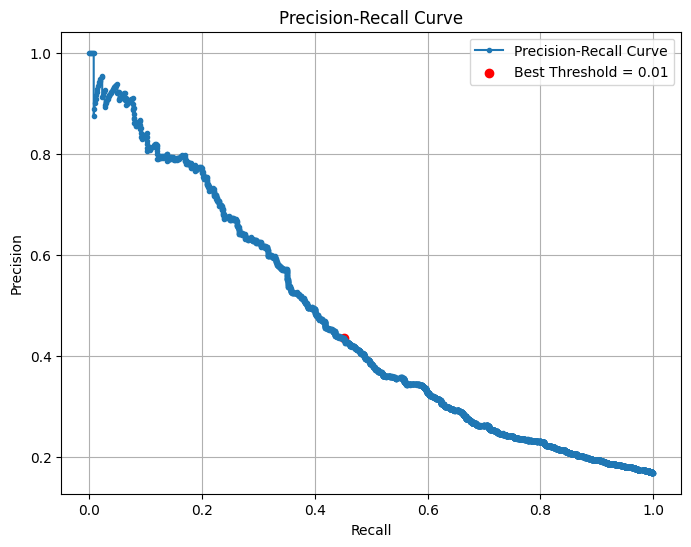

Best Confidence Threshold: 0.01
Best F1 Score: 0.44


In [84]:
plot_precision_recall_curve(runner, 
                            "vehicle_detection_satellite_coco/final_images", 
                            "vehicle_detection_satellite_coco/final_annotations.json")

SOME EXAMPLE DETECTION RESULTS W/ TEXT QUERY BEFORE TRAINING
---------------------------------------------------------------


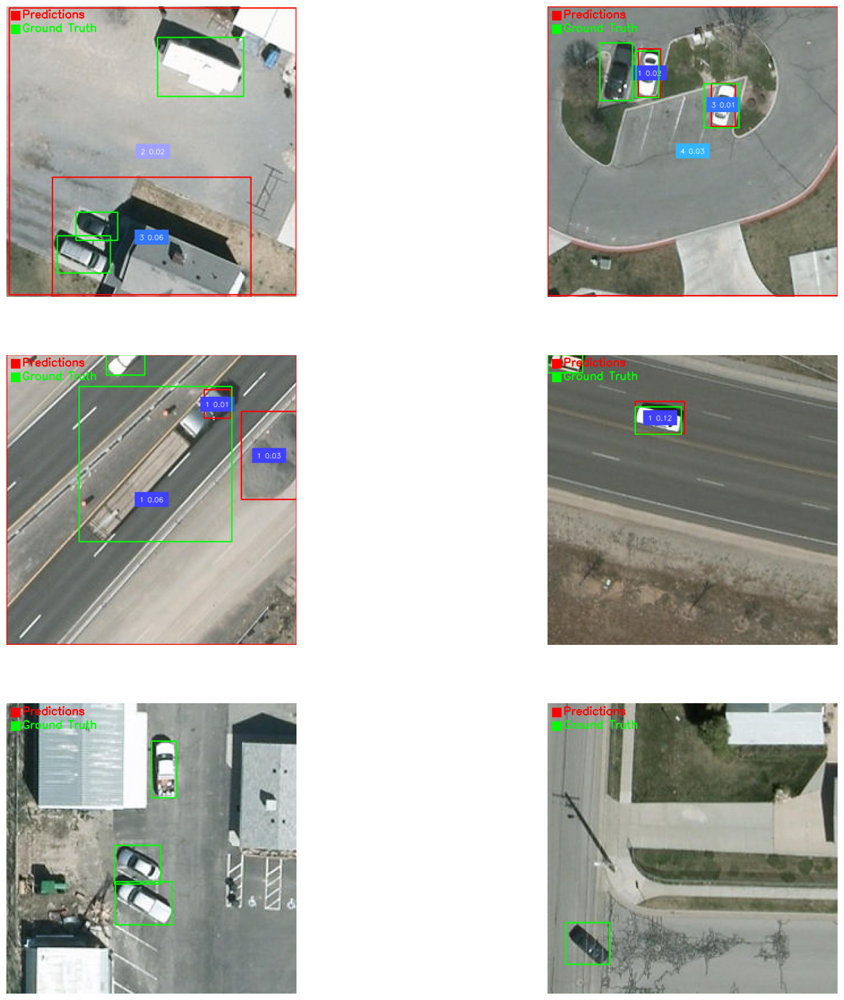

In [85]:
plot_sample_detections("vehicle_detection_satellite_coco/final_annotations.json", 
                       "vehicle_detection_satellite_coco/final_images", 0.01, 
                       "SOME EXAMPLE DETECTION RESULTS W/ TEXT QUERY BEFORE TRAINING")

## Train w/ text query

In [ ]:
#classes = ("camping car", "car", "pickup", "truck", "van")
#'camping car', 'pickup', 'truck' are training classes, 'car' and 'van' are reserved for zero-shot test classes

In [5]:
text_emb = np.load("MLCV_yolo_world_text_embeddings.npy")
training_text_embeddings = np.stack([text_emb[0],text_emb[2],text_emb[3]])
zeroshot_text_embeddings = np.stack([text_emb[1],text_emb[4]])

np.save("MLCV_yoloworld_training_text_embeddings",training_text_embeddings)
np.save("MLCV_yoloworld_zeroshot_text_embeddings",zeroshot_text_embeddings)

In [10]:
runner = load_model_train("pretrained_models/yolo_world_v2_l_vlpan_bn_sgd_1e-3_40e_8gpus_finetune_coco_ep80-e1288152.pth", "MLCV_configs/tuning_yolo_world/mlcv_yolo_world_training_config.py")

11/09 09:03:55 - mmengine - WARNING - Failed to search registry with scope "mmyolo" in the "log_processor" registry tree. As a workaround, the current "log_processor" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmyolo" is a correct scope, or whether the registry is initialized.
11/09 09:03:55 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.19 (default, Mar 20 2024, 19:58:24) [GCC 11.2.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1565096646
    GPU 0: NVIDIA GeForce RTX 2070 SUPER
    GPU 1: NVIDIA GeForce GTX 1080
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.2, V11.2.142
    GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.2) 9.4.0
    PyTorch: 1.11.0+cu113
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Int

11/09 09:03:58 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
11/09 09:03:58 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
after_load_checkpoint:
(49          ) EMAHook                            
 -------------------- 
before_train:
(9           ) YOLOv5ParamSchedulerHook           
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHo

In [12]:
runner.train()

11/09 09:04:37 - mmengine - WARNING - init_weights of SimpleYOLOWorldDetector has been called more than once.
11/09 09:04:37 - mmengine - INFO - Checkpoints will be saved to /fastdata/pelinsu/YOLO-World.
11/09 09:04:54 - mmengine - INFO - Epoch(train)  [1][50/56]  base_lr: 2.0000e-03 lr: 9.8000e-05  eta: 0:15:15  time: 0.3328  data_time: 0.0117  memory: 6515  grad_norm: 469.8739  loss: 30.4088  loss_cls: 17.3202  loss_bbox: 6.6979  loss_dfl: 6.3906
11/09 09:04:57 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241109_090355
11/09 09:05:13 - mmengine - INFO - Epoch(train)  [2][50/56]  base_lr: 2.0000e-03 lr: 2.0584e-04  eta: 0:15:22  time: 0.3309  data_time: 0.0098  memory: 5941  grad_norm: 378.6598  loss: 23.8587  loss_cls: 11.3497  loss_bbox: 6.3605  loss_dfl: 6.1486
11/09 09:05:15 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241109_090355
11/09 09:05:32 - mmengine - INFO - Epoch(train)  [3][50/56]  base_lr: 2.0000e-03 lr: 3.0925e-04  eta: 0:14:53  t

11/09 09:07:56 - mmengine - INFO - Epoch(val) [10][28/28]    coco/camping car_precision: 0.4910  coco/pickup_precision: 0.0930  coco/truck_precision: 0.1040  coco/bbox_mAP: 0.2290  coco/bbox_mAP_50: 0.3790  coco/bbox_mAP_75: 0.2420  coco/bbox_mAP_s: -1.0000  coco/bbox_mAP_m: 0.2800  coco/bbox_mAP_l: 0.3140  data_time: 0.0005  time: 0.0310
11/09 09:08:13 - mmengine - INFO - Epoch(train) [11][50/56]  base_lr: 2.0000e-03 lr: 9.7684e-04  eta: 0:12:28  time: 0.3459  data_time: 0.0099  memory: 5941  grad_norm: 223.8523  loss: 11.8706  loss_cls: 3.6577  loss_bbox: 3.7715  loss_dfl: 4.4413
11/09 09:08:15 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241109_090355
11/09 09:08:33 - mmengine - INFO - Epoch(train) [12][50/56]  base_lr: 2.0000e-03 lr: 1.0403e-03  eta: 0:12:09  time: 0.3470  data_time: 0.0096  memory: 5941  grad_norm: 211.4401  loss: 11.6866  loss_cls: 3.5281  loss_bbox: 3.7336  loss_dfl: 4.4249
11/09 09:08:35 - mmengine - INFO - Exp name: mlcv_yolo_world_training_

11/09 09:11:12 - mmengine - INFO - Epoch(train) [20][50/56]  base_lr: 2.0000e-03 lr: 1.2872e-03  eta: 0:09:38  time: 0.3461  data_time: 0.0097  memory: 6001  grad_norm: 159.8637  loss: 10.7028  loss_cls: 3.1649  loss_bbox: 3.4047  loss_dfl: 4.1332
11/09 09:11:14 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241109_090355
11/09 09:11:14 - mmengine - INFO - Saving checkpoint at 20 epochs
11/09 09:11:17 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.142
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.210
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.176
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Avera

11/09 09:12:18 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.247
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.348
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.283
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.261
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.391
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.594
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 50 ] = 0.594
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.594
 Average Reca

11/09 09:13:21 - mmengine - INFO - bbox_mAP_copypaste: 0.266 0.379 0.320 -1.000 0.214 0.495
11/09 09:13:21 - mmengine - INFO - Epoch(val) [26][28/28]    coco/camping car_precision: 0.4580  coco/pickup_precision: 0.1320  coco/truck_precision: 0.2090  coco/bbox_mAP: 0.2660  coco/bbox_mAP_50: 0.3790  coco/bbox_mAP_75: 0.3200  coco/bbox_mAP_s: -1.0000  coco/bbox_mAP_m: 0.2140  coco/bbox_mAP_l: 0.4950  data_time: 0.0004  time: 0.0305
11/09 09:13:38 - mmengine - INFO - Epoch(train) [27][50/56]  base_lr: 2.0000e-03 lr: 1.0100e-03  eta: 0:07:23  time: 0.3430  data_time: 0.0083  memory: 5941  grad_norm: 240.5735  loss: 16.6520  loss_cls: 5.7328  loss_bbox: 5.4278  loss_dfl: 5.4915
11/09 09:13:40 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241109_090355
11/09 09:13:41 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulatin

11/09 09:14:39 - mmengine - INFO - Epoch(train) [30][50/56]  base_lr: 2.0000e-03 lr: 8.9120e-04  eta: 0:06:25  time: 0.3435  data_time: 0.0085  memory: 5828  grad_norm: 197.9828  loss: 15.9874  loss_cls: 5.2278  loss_bbox: 5.2942  loss_dfl: 5.4653
11/09 09:14:41 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241109_090355
11/09 09:14:41 - mmengine - INFO - Saving checkpoint at 30 epochs
11/09 09:14:44 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.03s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.271
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.389
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.320
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Avera

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.322
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.473
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.332
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.357
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.515
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.612
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 50 ] = 0.612
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.612
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

11/09 09:16:47 - mmengine - INFO - bbox_mAP_copypaste: 0.312 0.472 0.312 -1.000 0.309 0.449
11/09 09:16:47 - mmengine - INFO - Epoch(val) [36][28/28]    coco/camping car_precision: 0.4650  coco/pickup_precision: 0.1440  coco/truck_precision: 0.3270  coco/bbox_mAP: 0.3120  coco/bbox_mAP_50: 0.4720  coco/bbox_mAP_75: 0.3120  coco/bbox_mAP_s: -1.0000  coco/bbox_mAP_m: 0.3090  coco/bbox_mAP_l: 0.4490  data_time: 0.0004  time: 0.0304
11/09 09:17:05 - mmengine - INFO - Epoch(train) [37][50/56]  base_lr: 2.0000e-03 lr: 6.1400e-04  eta: 0:04:11  time: 0.3435  data_time: 0.0085  memory: 5994  grad_norm: 168.8203  loss: 13.6893  loss_cls: 3.8858  loss_bbox: 4.7246  loss_dfl: 5.0789
11/09 09:17:07 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241109_090355
11/09 09:17:08 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulatin

11/09 09:18:05 - mmengine - INFO - Epoch(train) [40][50/56]  base_lr: 2.0000e-03 lr: 4.9520e-04  eta: 0:03:13  time: 0.3455  data_time: 0.0087  memory: 5994  grad_norm: 204.3136  loss: 13.1084  loss_cls: 3.6309  loss_bbox: 4.5411  loss_dfl: 4.9365
11/09 09:18:07 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241109_090355
11/09 09:18:08 - mmengine - INFO - Saving checkpoint at 40 epochs
11/09 09:18:11 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.412
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.566
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.476
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Avera

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.444
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.608
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.498
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.468
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.580
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.618
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 50 ] = 0.618
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.618
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

11/09 09:20:14 - mmengine - INFO - bbox_mAP_copypaste: 0.386 0.557 0.410 -1.000 0.408 0.625
11/09 09:20:14 - mmengine - INFO - Epoch(val) [46][28/28]    coco/camping car_precision: 0.5570  coco/pickup_precision: 0.2300  coco/truck_precision: 0.3720  coco/bbox_mAP: 0.3860  coco/bbox_mAP_50: 0.5570  coco/bbox_mAP_75: 0.4100  coco/bbox_mAP_s: -1.0000  coco/bbox_mAP_m: 0.4080  coco/bbox_mAP_l: 0.6250  data_time: 0.0005  time: 0.0313
11/09 09:20:31 - mmengine - INFO - Epoch(train) [47][50/56]  base_lr: 2.0000e-03 lr: 2.1800e-04  eta: 0:00:59  time: 0.3442  data_time: 0.0088  memory: 5994  grad_norm: 206.6126  loss: 11.9263  loss_cls: 3.2149  loss_bbox: 4.1043  loss_dfl: 4.6071
11/09 09:20:33 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241109_090355
11/09 09:20:34 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulatin

11/09 09:21:32 - mmengine - INFO - Epoch(train) [50][50/56]  base_lr: 2.0000e-03 lr: 9.9200e-05  eta: 0:00:02  time: 0.3434  data_time: 0.0085  memory: 5994  grad_norm: 154.5787  loss: 11.4418  loss_cls: 2.7703  loss_bbox: 4.0688  loss_dfl: 4.6026
11/09 09:21:34 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241109_090355
11/09 09:21:34 - mmengine - INFO - Saving checkpoint at 50 epochs
11/09 09:21:37 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.414
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.593
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.448
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Avera

SimpleYOLOWorldDetector(
  (data_preprocessor): YOLOv5DetDataPreprocessor()
  (backbone): MultiModalYOLOBackbone(
    (image_model): YOLOv8CSPDarknet(
      (stem): ConvModule(
        (conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (activate): SiLU(inplace=True)
      )
      (stage1): Sequential(
        (0): ConvModule(
          (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (activate): SiLU(inplace=True)
        )
        (1): CSPLayerWithTwoConv(
          (main_conv): ConvModule(
            (conv): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
            (activate): SiLU(inplace

In [36]:
loss_cls,loss_bbox,loss_dfl,mAP,mAP_50,mAP_75=training_history("MLCV_training_history_w_text_embeddings")

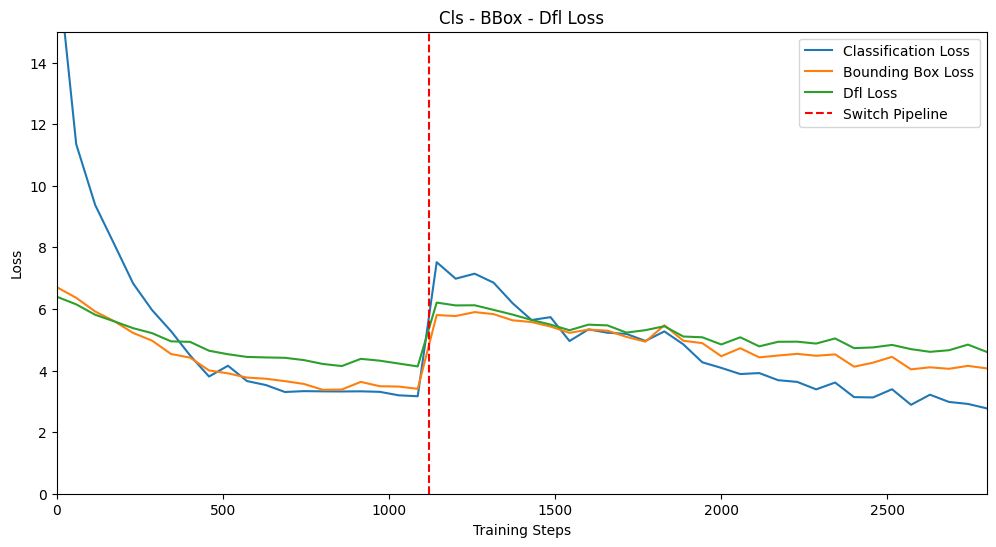

In [37]:
plot_training_loss(swith_epoch = 20, num_epoch = 50, steps_per_epoch=56)

# test zero shot

In [37]:
runner = load_model_eval("yoloworld_text_embedding_weight.pth", "MLCV_configs/tuning_yolo_world/mlcv_yolo_world_zeroshot_config.py")

11/10 11:43:18 - mmengine - WARNING - Failed to search registry with scope "mmyolo" in the "log_processor" registry tree. As a workaround, the current "log_processor" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmyolo" is a correct scope, or whether the registry is initialized.
11/10 11:43:18 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.19 (default, Mar 20 2024, 19:58:24) [GCC 11.2.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1264320764
    GPU 0: NVIDIA GeForce RTX 2070 SUPER
    GPU 1: NVIDIA GeForce GTX 1080
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.2, V11.2.142
    GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.2) 9.4.0
    PyTorch: 1.11.0+cu113
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Int

11/10 11:43:21 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
11/10 11:43:21 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
after_load_checkpoint:
(49          ) EMAHook                            
 -------------------- 
before_train:
(9           ) YOLOv5ParamSchedulerHook           
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHo

In [35]:
runner.test()

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
11/09 09:54:10 - mmengine - INFO - Epoch(test) [ 50/501]    eta: 0:00:14  time: 0.0311  data_time: 0.0019  memory: 1096  
11/09 09:54:11 - mmengine - INFO - Epoch(test) [100/501]    eta: 0:00:12  time: 0.0289  data_time: 0.0002  memory: 857  
11/09 09:54:12 - mmengine - INFO - Epoch(test) [150/501]    eta: 0:00:10  time: 0.0289  data_time: 0.0002  memory: 857  
11/09 09:54:14 - mmengine - INFO - Epoch(test) [200/501]    eta: 0:00:08  time: 0.0290  data_time: 0.0002  memory: 857  
11/09 09:54:15 - mmengine - INFO - Epoch(test) [250/501]    eta: 0:00:07  time: 0.0290  data_time: 0.0002  memory: 857  
11/09 09:54:17 - mmengine - INFO - Epoch(test) [300/501]    eta: 0:00:05  time: 0.0291  data_time: 0.0002  memory: 857  
11/09 09:54:18 - mmengine - INFO - Epoch(test) [350/501]    eta: 0:00:04  time: 0.0291  data_time: 0.0002  

{'coco/camping car_precision': 0.493,
 'coco/car_precision': 0.109,
 'coco/pickup_precision': 0.33,
 'coco/truck_precision': 0.297,
 'coco/van_precision': 0.034,
 'coco/bbox_mAP': 0.253,
 'coco/bbox_mAP_50': 0.388,
 'coco/bbox_mAP_75': 0.296,
 'coco/bbox_mAP_s': 0.004,
 'coco/bbox_mAP_m': 0.214,
 'coco/bbox_mAP_l': 0.304}

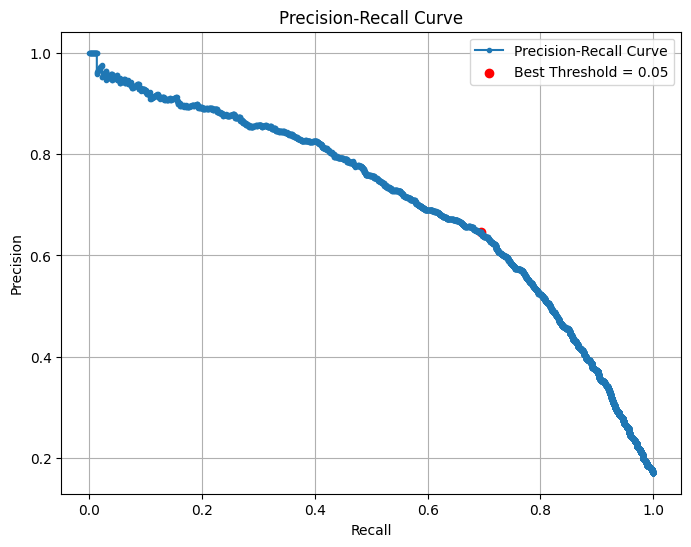

Best Confidence Threshold: 0.05
Best F1 Score: 0.67


In [81]:
plot_precision_recall_curve(runner, 
                            "vehicle_detection_satellite_coco/final_images", 
                            "vehicle_detection_satellite_coco/final_annotations.json")

SOME EXAMPLE DETECTION RESULTS W/ TEXT QUERY BEFORE TRAINING
---------------------------------------------------------------


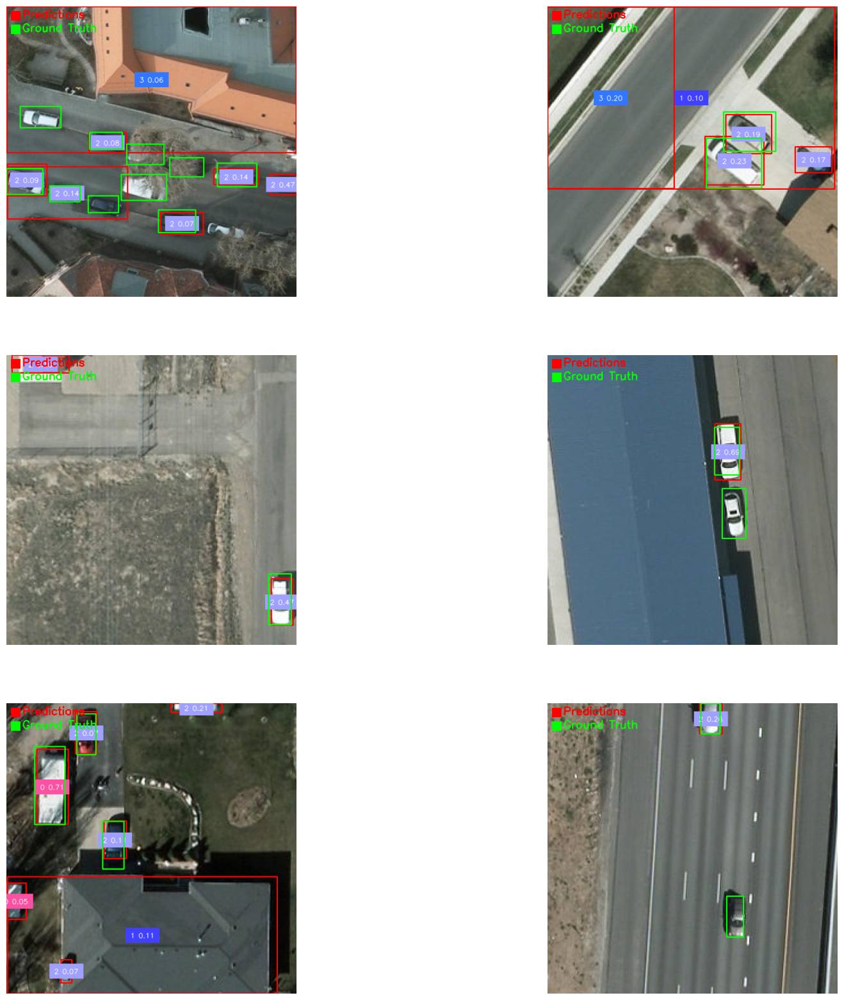

In [82]:
plot_sample_detections("vehicle_detection_satellite_coco/final_annotations.json", 
                       "vehicle_detection_satellite_coco/final_images", 0.05, 
                       "SOME EXAMPLE DETECTION RESULTS W/ TEXT QUERY AFTER TRAINING")

# IMAGE QUERY

In [98]:
runner = load_model_eval("pretrained_models/yolo_world_v2_l_vlpan_bn_sgd_1e-3_40e_8gpus_finetune_coco_ep80-e1288152.pth", "MLCV_configs/tuning_yolo_world/mlcv_yolo_world_zeroshot_config.py")

11/10 12:56:19 - mmengine - WARNING - Failed to search registry with scope "mmyolo" in the "log_processor" registry tree. As a workaround, the current "log_processor" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmyolo" is a correct scope, or whether the registry is initialized.
11/10 12:56:19 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.19 (default, Mar 20 2024, 19:58:24) [GCC 11.2.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 2123266604
    GPU 0: NVIDIA GeForce RTX 2070 SUPER
    GPU 1: NVIDIA GeForce GTX 1080
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.2, V11.2.142
    GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.2) 9.4.0
    PyTorch: 1.11.0+cu113
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Int

11/10 12:56:22 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
11/10 12:56:22 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
after_load_checkpoint:
(49          ) EMAHook                            
 -------------------- 
before_train:
(9           ) YOLOv5ParamSchedulerHook           
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHo

# test with original clip img embeddings before any training

In [25]:
runner.test()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
11/08 12:22:03 - mmengine - INFO - Epoch(test) [ 50/501]    eta: 0:00:15  time: 0.0346  data_time: 0.0018  memory: 4839  
11/08 12:22:05 - mmengine - INFO - Epoch(test) [100/501]    eta: 0:00:12  time: 0.0275  data_time: 0.0002  memory: 876  
11/08 12:22:06 - mmengine - INFO - Epoch(test) [150/501]    eta: 0:00:10  time: 0.0276  data_time: 0.0002  memory: 876  
11/08 12:22:07 - mmengine - INFO - Epoch(test) [200/501]    eta: 0:00:08  time: 0.0276  data_time: 0.0002  memory: 876  
11/08 12:22:09 - mmengine - INFO - Epoch(test) [250/501]    eta: 0:00:07  time: 0.0276  data_time: 0.0002  memory: 876  
11/08 12:22:10 - mmengine - INFO - Epoch(test) [300/501]    eta: 0:00:05  time: 0.0276  data_time: 0.0002  memory: 876  
11/08 12:22:12 - mmengine - INFO - Epoch(test) [350/501]    eta: 0:00:04  time: 0.0277  data_time: 0.0002  

{'coco/camping car_precision': 0.001,
 'coco/car_precision': 0.002,
 'coco/pickup_precision': 0.001,
 'coco/truck_precision': 0.0,
 'coco/van_precision': 0.0,
 'coco/bbox_mAP': 0.001,
 'coco/bbox_mAP_50': 0.001,
 'coco/bbox_mAP_75': 0.001,
 'coco/bbox_mAP_s': 0.0,
 'coco/bbox_mAP_m': 0.016,
 'coco/bbox_mAP_l': 0.001}

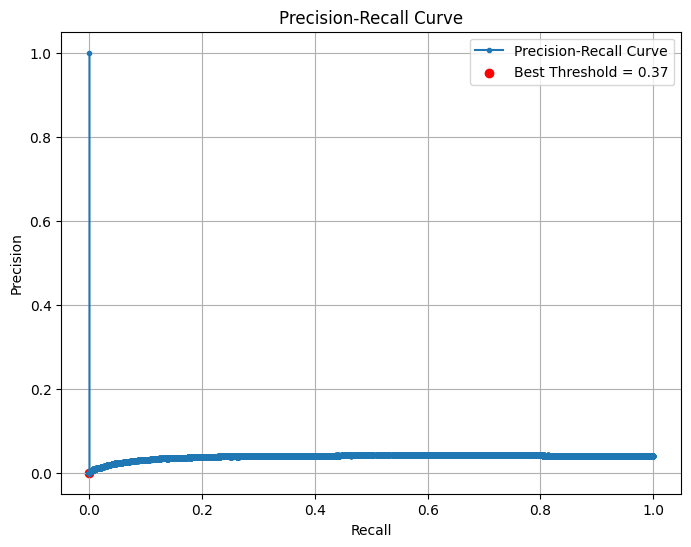

Best Confidence Threshold: 0.37
Best F1 Score: nan


In [100]:
plot_precision_recall_curve(runner, 
                            "vehicle_detection_satellite_coco/final_images", 
                            "vehicle_detection_satellite_coco/final_annotations.json")

SOME EXAMPLE DETECTION RESULTS W/ IMAGE QUERY BEFORE TRAINING
---------------------------------------------------------------


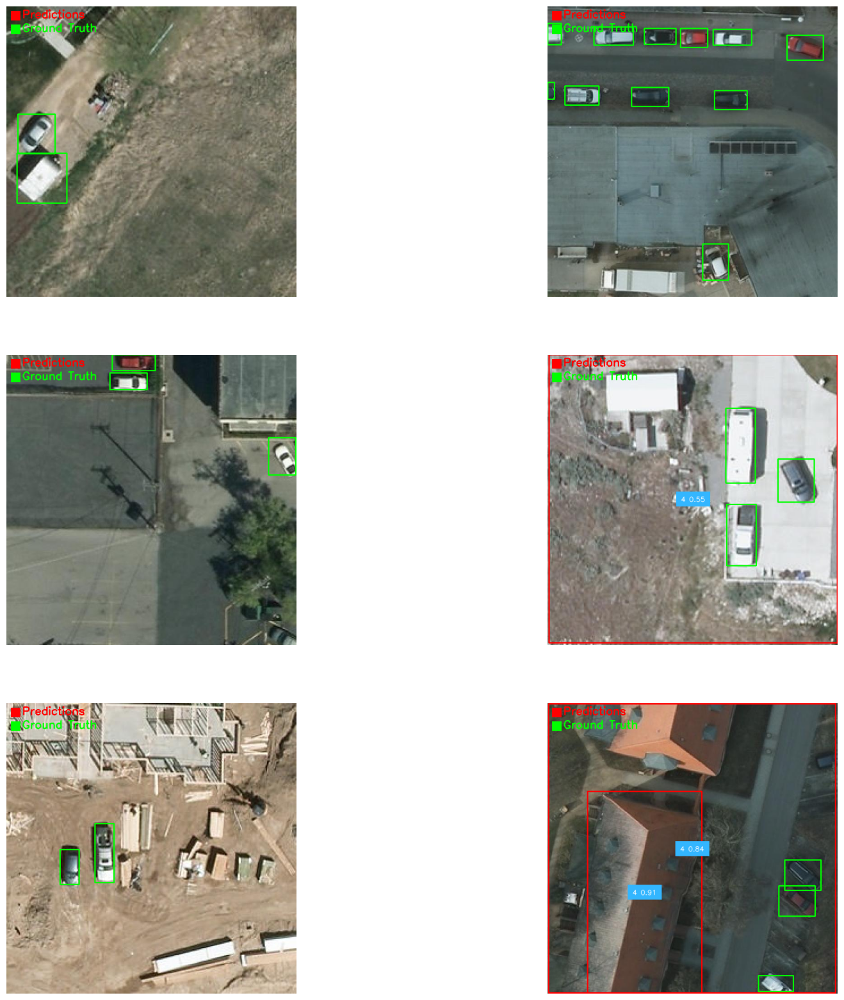

In [101]:
plot_sample_detections("vehicle_detection_satellite_coco/final_annotations.json", 
                       "vehicle_detection_satellite_coco/final_images", 0.37, 
                       "SOME EXAMPLE DETECTION RESULTS W/ IMAGE QUERY BEFORE TRAINING")

# train with original clip img embeddings

In [ ]:
#classes = ("camping car", "car", "pickup", "truck", "van")
#'camping car', 'pickup', 'truck' are training classes, 'car' and 'van' are reserved for zero-shot test classes

In [8]:
img_emb = np.load("MLCV_yoloworld_image_embeddings.npy")
training_img_embeddings = np.stack([img_emb[0],img_emb[2],img_emb[3]])
zeroshot_img_embeddings = np.stack([img_emb[1],img_emb[4]])

np.save("MLCV_yoloworld_training_image_embeddings",training_img_embeddings)
np.save("MLCV_yoloworld_zeroshot_image_embeddings",zeroshot_img_embeddings)

tuned_img_emb = np.load("MLCV_yoloworld_finetuned_image_embeddings2.npy")
tuned_training_img_embeddings = np.stack([tuned_img_emb[0],tuned_img_emb[2],tuned_img_emb[3]])
tuned_zeroshot_img_embeddings = np.stack([tuned_img_emb[1],tuned_img_emb[4]])

np.save("MLCV_yoloworld_training_tuned_image_embeddings2",tuned_training_img_embeddings)
np.save("MLCV_yoloworld_zeroshot_tuned_image_embeddings2",tuned_zeroshot_img_embeddings)

In [26]:
runner = load_model_train("pretrained_models/yolo_world_v2_l_vlpan_bn_sgd_1e-3_40e_8gpus_finetune_coco_ep80-e1288152.pth", "MLCV_configs/tuning_yolo_world/mlcv_yolo_world_training_config.py")

11/08 12:24:00 - mmengine - WARNING - Failed to search registry with scope "mmyolo" in the "log_processor" registry tree. As a workaround, the current "log_processor" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmyolo" is a correct scope, or whether the registry is initialized.
11/08 12:24:00 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.19 (default, Mar 20 2024, 19:58:24) [GCC 11.2.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 208604845
    GPU 0: NVIDIA GeForce RTX 2070 SUPER
    GPU 1: NVIDIA GeForce GTX 1080
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.2, V11.2.142
    GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.2) 9.4.0
    PyTorch: 1.11.0+cu113
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Inte

11/08 12:24:03 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
11/08 12:24:03 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
after_load_checkpoint:
(49          ) EMAHook                            
 -------------------- 
before_train:
(9           ) YOLOv5ParamSchedulerHook           
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHo

In [27]:
runner.train()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
11/08 12:24:19 - mmengine - INFO - Optimizer groups: 121 .bias, 111 conv.weight, 104 other
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Loads checkpoint by local backend from path: pretrained_models/yolo_world_v2_l_vlpan_bn_sgd_1e-3_40e_8gpus_finetune_coco_ep80-e1288152.pth
The model and loaded state dict do not match exactly

size mismatch for embeddings: copying a param with shape torch.Size([80, 512]) from checkpoint, the shape in current model is torch.Size([3, 512]).
The model and loaded state dict do not match exactly

size mismatch for embeddings: copying a param with shape torch.Size([80, 512]) from checkpoint, the shape in current model is torch.Size([3, 512]).
11/08 12:24:20 - mmengine - INFO - Load checkpoint from pretrained_models/yolo_world_v2_l_vlpan_bn_sgd_1e-3_40e_8gpus

11/08 12:27:36 - mmengine - INFO - bbox_mAP_copypaste: 0.150 0.243 0.176 -1.000 0.125 0.314
11/08 12:27:36 - mmengine - INFO - Epoch(val) [10][28/28]    coco/camping car_precision: 0.2580  coco/pickup_precision: 0.1160  coco/truck_precision: 0.0760  coco/bbox_mAP: 0.1500  coco/bbox_mAP_50: 0.2430  coco/bbox_mAP_75: 0.1760  coco/bbox_mAP_s: -1.0000  coco/bbox_mAP_m: 0.1250  coco/bbox_mAP_l: 0.3140  data_time: 0.0005  time: 0.0293
11/08 12:27:53 - mmengine - INFO - Epoch(train) [11][50/56]  base_lr: 2.0000e-03 lr: 9.7684e-04  eta: 0:12:16  time: 0.3440  data_time: 0.0107  memory: 5425  grad_norm: 190.6773  loss: 11.8800  loss_cls: 3.5253  loss_bbox: 3.7578  loss_dfl: 4.5969
11/08 12:27:55 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_122400
11/08 12:28:12 - mmengine - INFO - Epoch(train) [12][50/56]  base_lr: 2.0000e-03 lr: 1.0403e-03  eta: 0:11:58  time: 0.3449  data_time: 0.0108  memory: 5408  grad_norm: 193.3904  loss: 11.4070  loss_cls: 3.4502  loss_bbox: 3.5

11/08 12:30:51 - mmengine - INFO - Epoch(train) [20][50/56]  base_lr: 2.0000e-03 lr: 1.2872e-03  eta: 0:09:32  time: 0.3475  data_time: 0.0112  memory: 5252  grad_norm: 187.1224  loss: 10.6155  loss_cls: 3.2124  loss_bbox: 3.2214  loss_dfl: 4.1816
11/08 12:30:53 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_122400
11/08 12:30:53 - mmengine - INFO - Saving checkpoint at 20 epochs
11/08 12:30:57 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.286
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.432
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.305
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Avera

11/08 12:31:57 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.155
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.255
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.171
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.139
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.373
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.542
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 50 ] = 0.542
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.542
 Average Reca

11/08 12:33:00 - mmengine - INFO - bbox_mAP_copypaste: 0.330 0.505 0.363 -1.000 0.351 0.533
11/08 12:33:00 - mmengine - INFO - Epoch(val) [26][28/28]    coco/camping car_precision: 0.5410  coco/pickup_precision: 0.0970  coco/truck_precision: 0.3500  coco/bbox_mAP: 0.3300  coco/bbox_mAP_50: 0.5050  coco/bbox_mAP_75: 0.3630  coco/bbox_mAP_s: -1.0000  coco/bbox_mAP_m: 0.3510  coco/bbox_mAP_l: 0.5330  data_time: 0.0005  time: 0.0295
11/08 12:33:17 - mmengine - INFO - Epoch(train) [27][50/56]  base_lr: 2.0000e-03 lr: 1.0100e-03  eta: 0:07:19  time: 0.3423  data_time: 0.0088  memory: 5398  grad_norm: 240.8159  loss: 16.9265  loss_cls: 5.6895  loss_bbox: 5.5243  loss_dfl: 5.7127
11/08 12:33:19 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_122400
11/08 12:33:20 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulatin

11/08 12:34:17 - mmengine - INFO - Epoch(train) [30][50/56]  base_lr: 2.0000e-03 lr: 8.9120e-04  eta: 0:06:22  time: 0.3414  data_time: 0.0085  memory: 5398  grad_norm: 208.3852  loss: 14.8434  loss_cls: 4.6548  loss_bbox: 4.9997  loss_dfl: 5.1889
11/08 12:34:19 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_122400
11/08 12:34:19 - mmengine - INFO - Saving checkpoint at 30 epochs
11/08 12:34:22 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.256
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.364
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.299
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Avera

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.363
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.499
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.366
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.305
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.714
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.657
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 50 ] = 0.657
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.657
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

11/08 12:36:24 - mmengine - INFO - bbox_mAP_copypaste: 0.367 0.530 0.374 -1.000 0.348 0.546
11/08 12:36:24 - mmengine - INFO - Epoch(val) [36][28/28]    coco/camping car_precision: 0.4670  coco/pickup_precision: 0.1850  coco/truck_precision: 0.4480  coco/bbox_mAP: 0.3670  coco/bbox_mAP_50: 0.5300  coco/bbox_mAP_75: 0.3740  coco/bbox_mAP_s: -1.0000  coco/bbox_mAP_m: 0.3480  coco/bbox_mAP_l: 0.5460  data_time: 0.0004  time: 0.0294
11/08 12:36:42 - mmengine - INFO - Epoch(train) [37][50/56]  base_lr: 2.0000e-03 lr: 6.1400e-04  eta: 0:04:09  time: 0.3417  data_time: 0.0087  memory: 5398  grad_norm: 175.6482  loss: 13.6270  loss_cls: 3.7811  loss_bbox: 4.7861  loss_dfl: 5.0599
11/08 12:36:43 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_122400
11/08 12:36:44 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulatin

11/08 12:37:42 - mmengine - INFO - Epoch(train) [40][50/56]  base_lr: 2.0000e-03 lr: 4.9520e-04  eta: 0:03:12  time: 0.3431  data_time: 0.0081  memory: 5345  grad_norm: 166.3067  loss: 12.8545  loss_cls: 3.5171  loss_bbox: 4.3158  loss_dfl: 5.0216
11/08 12:37:44 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_122400
11/08 12:37:44 - mmengine - INFO - Saving checkpoint at 40 epochs
11/08 12:37:47 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.378
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.545
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.394
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Avera

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.398
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.570
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.406
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.371
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.616
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.632
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 50 ] = 0.632
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.632
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

11/08 12:39:49 - mmengine - INFO - bbox_mAP_copypaste: 0.364 0.514 0.362 -1.000 0.339 0.597
11/08 12:39:49 - mmengine - INFO - Epoch(val) [46][28/28]    coco/camping car_precision: 0.5170  coco/pickup_precision: 0.2270  coco/truck_precision: 0.3490  coco/bbox_mAP: 0.3640  coco/bbox_mAP_50: 0.5140  coco/bbox_mAP_75: 0.3620  coco/bbox_mAP_s: -1.0000  coco/bbox_mAP_m: 0.3390  coco/bbox_mAP_l: 0.5970  data_time: 0.0005  time: 0.0295
11/08 12:40:06 - mmengine - INFO - Epoch(train) [47][50/56]  base_lr: 2.0000e-03 lr: 2.1800e-04  eta: 0:00:59  time: 0.3412  data_time: 0.0082  memory: 5345  grad_norm: 157.9366  loss: 12.0107  loss_cls: 2.9677  loss_bbox: 4.1779  loss_dfl: 4.8651
11/08 12:40:08 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_122400
11/08 12:40:09 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulatin

11/08 12:41:06 - mmengine - INFO - Epoch(train) [50][50/56]  base_lr: 2.0000e-03 lr: 9.9200e-05  eta: 0:00:02  time: 0.3422  data_time: 0.0083  memory: 5398  grad_norm: 171.4161  loss: 11.9190  loss_cls: 2.9322  loss_bbox: 4.1232  loss_dfl: 4.8636
11/08 12:41:08 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_122400
11/08 12:41:08 - mmengine - INFO - Saving checkpoint at 50 epochs
11/08 12:41:11 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.419
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.588
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.424
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Avera

SimpleYOLOWorldDetector(
  (data_preprocessor): YOLOv5DetDataPreprocessor()
  (backbone): MultiModalYOLOBackbone(
    (image_model): YOLOv8CSPDarknet(
      (stem): ConvModule(
        (conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (activate): SiLU(inplace=True)
      )
      (stage1): Sequential(
        (0): ConvModule(
          (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (activate): SiLU(inplace=True)
        )
        (1): CSPLayerWithTwoConv(
          (main_conv): ConvModule(
            (conv): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
            (activate): SiLU(inplace

In [38]:
loss_cls,loss_bbox,loss_dfl,mAP,mAP_50,mAP_75=training_history("MLCV_training_history_w_image_embeddings")

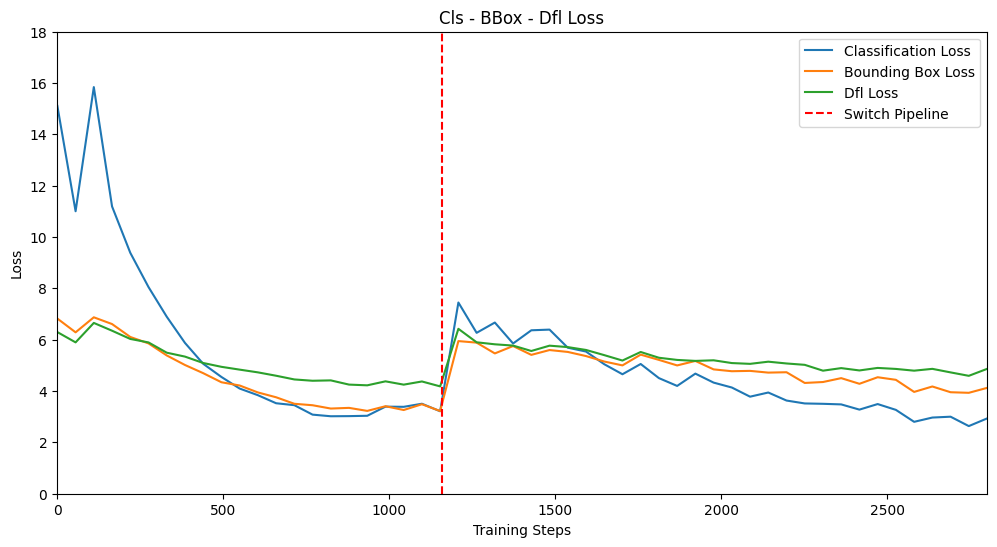

In [46]:
plot_training_loss(swith_epoch = 20, num_epoch = 50, steps_per_epoch=56)

# test after training with original clip embeddings

In [102]:
runner = load_model_eval("yoloworld_image_embedding_weight.pth", "MLCV_configs/tuning_yolo_world/mlcv_yolo_world_zeroshot_config.py")

11/10 12:58:04 - mmengine - WARNING - Failed to search registry with scope "mmyolo" in the "log_processor" registry tree. As a workaround, the current "log_processor" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmyolo" is a correct scope, or whether the registry is initialized.
11/10 12:58:04 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.19 (default, Mar 20 2024, 19:58:24) [GCC 11.2.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 14953709
    GPU 0: NVIDIA GeForce RTX 2070 SUPER
    GPU 1: NVIDIA GeForce GTX 1080
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.2, V11.2.142
    GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.2) 9.4.0
    PyTorch: 1.11.0+cu113
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel

11/10 12:58:07 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
11/10 12:58:07 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
after_load_checkpoint:
(49          ) EMAHook                            
 -------------------- 
before_train:
(9           ) YOLOv5ParamSchedulerHook           
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHo

In [43]:
runner.test()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
11/08 16:47:33 - mmengine - INFO - Epoch(test) [ 50/501]    eta: 0:00:13  time: 0.0298  data_time: 0.0022  memory: 1850  
11/08 16:47:34 - mmengine - INFO - Epoch(test) [100/501]    eta: 0:00:11  time: 0.0274  data_time: 0.0002  memory: 1613  
11/08 16:47:35 - mmengine - INFO - Epoch(test) [150/501]    eta: 0:00:09  time: 0.0274  data_time: 0.0002  memory: 1613  
11/08 16:47:37 - mmengine - INFO - Epoch(test) [200/501]    eta: 0:00:08  time: 0.0274  data_time: 0.0002  memory: 1613  
11/08 16:47:38 - mmengine - INFO - Epoch(test) [250/501]    eta: 0:00:06  time: 0.0274  data_time: 0.0002  memory: 1613  
11/08 16:47:40 - mmengine - INFO - Epoch(test) [300/501]    eta: 0:00:05  time: 0.0274  data_time: 0.0002  memory: 1613  
11/08 16:47:41 - mmengine - INFO - Epoch(test) [350/501]    eta: 0:00:04  time: 0.0274  data_time: 0.0

{'coco/camping car_precision': 0.457,
 'coco/car_precision': 0.162,
 'coco/pickup_precision': 0.417,
 'coco/truck_precision': 0.356,
 'coco/van_precision': 0.032,
 'coco/bbox_mAP': 0.285,
 'coco/bbox_mAP_50': 0.437,
 'coco/bbox_mAP_75': 0.344,
 'coco/bbox_mAP_s': 0.001,
 'coco/bbox_mAP_m': 0.2,
 'coco/bbox_mAP_l': 0.333}

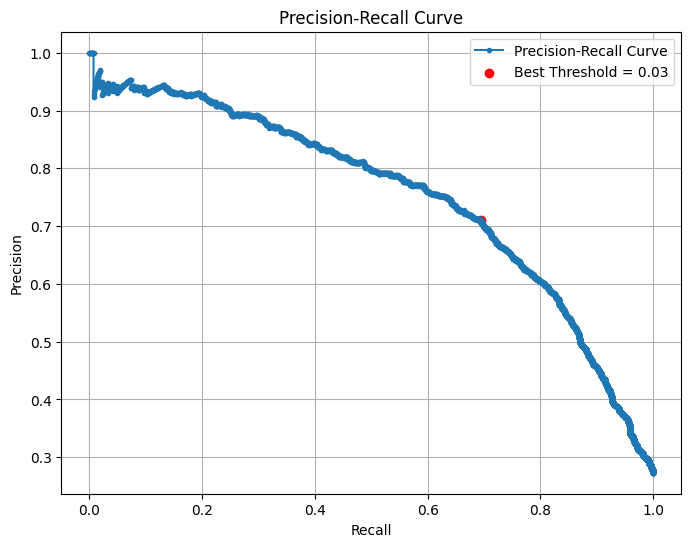

Best Confidence Threshold: 0.03
Best F1 Score: 0.70


In [104]:
plot_precision_recall_curve(runner, 
                            "vehicle_detection_satellite_coco/final_images", 
                            "vehicle_detection_satellite_coco/final_annotations.json")

SOME EXAMPLE DETECTION RESULTS W/ IMAGE QUERY AFTER TRAINING
---------------------------------------------------------------


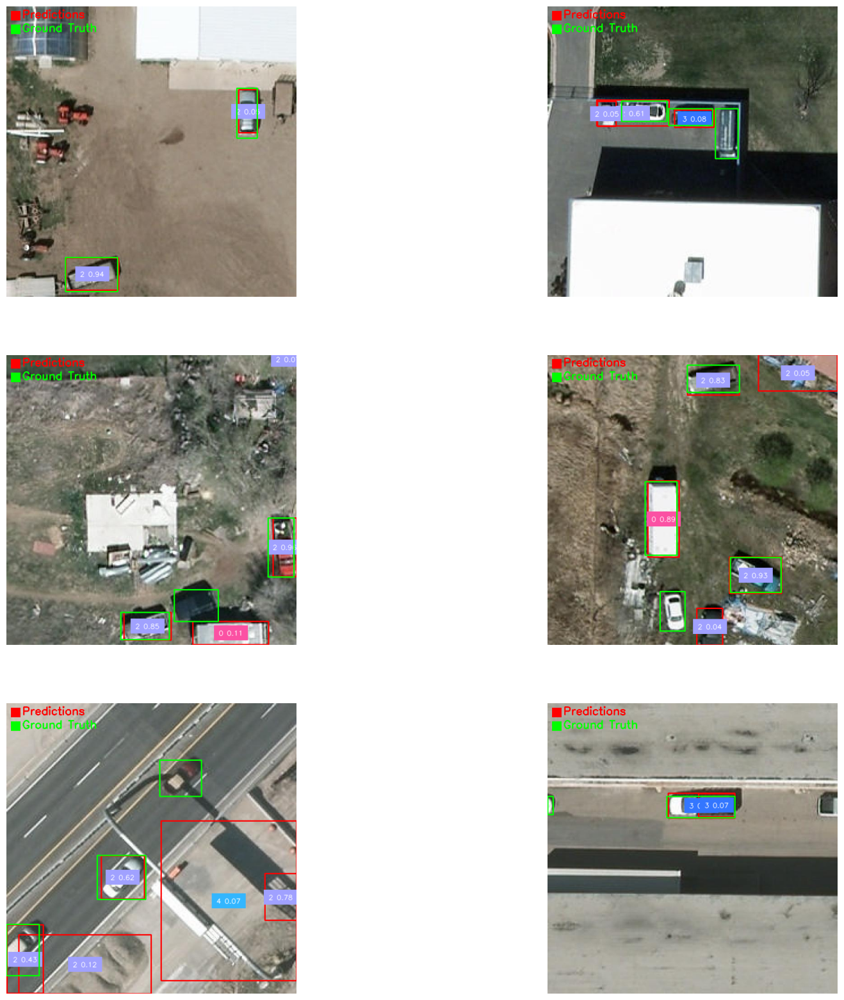

In [105]:
plot_sample_detections("vehicle_detection_satellite_coco/final_annotations.json", 
                       "vehicle_detection_satellite_coco/final_images", 0.03, 
                       "SOME EXAMPLE DETECTION RESULTS W/ IMAGE QUERY AFTER TRAINING")

# train with fine-tuned clip embeddings

In [10]:
runner = load_model_train("pretrained_models/yolo_world_v2_l_vlpan_bn_sgd_1e-3_40e_8gpus_finetune_coco_ep80-e1288152.pth", "MLCV_configs/tuning_yolo_world/mlcv_yolo_world_training_config.py")

11/08 15:48:36 - mmengine - WARNING - Failed to search registry with scope "mmyolo" in the "log_processor" registry tree. As a workaround, the current "log_processor" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmyolo" is a correct scope, or whether the registry is initialized.
11/08 15:48:36 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.19 (default, Mar 20 2024, 19:58:24) [GCC 11.2.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 349964624
    GPU 0: NVIDIA GeForce RTX 2070 SUPER
    GPU 1: NVIDIA GeForce GTX 1080
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.2, V11.2.142
    GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.2) 9.4.0
    PyTorch: 1.11.0+cu113
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Inte

11/08 15:48:39 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
11/08 15:48:39 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
after_load_checkpoint:
(49          ) EMAHook                            
 -------------------- 
before_train:
(9           ) YOLOv5ParamSchedulerHook           
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHo

In [11]:
runner.train()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
11/08 15:48:48 - mmengine - INFO - Optimizer groups: 121 .bias, 111 conv.weight, 104 other
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Loads checkpoint by local backend from path: pretrained_models/yolo_world_v2_l_vlpan_bn_sgd_1e-3_40e_8gpus_finetune_coco_ep80-e1288152.pth
The model and loaded state dict do not match exactly

size mismatch for embeddings: copying a param with shape torch.Size([80, 512]) from checkpoint, the shape in current model is torch.Size([3, 512]).
The model and loaded state dict do not match exactly

size mismatch for embeddings: copying a param with shape torch.Size([80, 512]) from checkpoint, the shape in current model is torch.Size([3, 512]).
11/08 15:48:50 - mmengine - INFO - Load checkpoint from pretrained_models/yolo_world_v2_l_vlpan_bn_sgd_1e-3_40e_8gpus

11/08 15:49:08 - mmengine - INFO - Epoch(train)  [1][50/56]  base_lr: 2.0000e-03 lr: 9.8000e-05  eta: 0:16:58  time: 0.3703  data_time: 0.0118  memory: 5850  grad_norm: 826.4057  loss: 35.4271  loss_cls: 22.0376  loss_bbox: 6.7636  loss_dfl: 6.6259
11/08 15:49:12 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_154836
11/08 15:49:29 - mmengine - INFO - Epoch(train)  [2][50/56]  base_lr: 2.0000e-03 lr: 2.0584e-04  eta: 0:16:26  time: 0.3292  data_time: 0.0108  memory: 5848  grad_norm: 403.5983  loss: 25.5554  loss_cls: 12.7322  loss_bbox: 6.4169  loss_dfl: 6.4063
11/08 15:49:31 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_154836
11/08 15:49:47 - mmengine - INFO - Epoch(train)  [3][50/56]  base_lr: 2.0000e-03 lr: 3.0925e-04  eta: 0:15:31  time: 0.3304  data_time: 0.0098  memory: 5037  grad_norm: 338.5861  loss: 21.7863  loss_cls: 9.7191  loss_bbox: 6.0364  loss_dfl: 6.0308
11/08 15:49:49 - mmengine - INFO - Exp name: mlcv_yolo_world_trainin

11/08 15:52:27 - mmengine - INFO - Epoch(train) [11][50/56]  base_lr: 2.0000e-03 lr: 9.7684e-04  eta: 0:12:28  time: 0.3428  data_time: 0.0103  memory: 5036  grad_norm: 214.3696  loss: 12.0475  loss_cls: 3.7254  loss_bbox: 3.6755  loss_dfl: 4.6466
11/08 15:52:29 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_154836
11/08 15:52:46 - mmengine - INFO - Epoch(train) [12][50/56]  base_lr: 2.0000e-03 lr: 1.0403e-03  eta: 0:12:09  time: 0.3441  data_time: 0.0097  memory: 5036  grad_norm: 185.1923  loss: 11.2570  loss_cls: 3.2787  loss_bbox: 3.4854  loss_dfl: 4.4929
11/08 15:52:48 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_154836
11/08 15:53:05 - mmengine - INFO - Epoch(train) [13][50/56]  base_lr: 2.0000e-03 lr: 1.0994e-03  eta: 0:11:50  time: 0.3449  data_time: 0.0093  memory: 5036  grad_norm: 197.7551  loss: 11.2089  loss_cls: 3.2354  loss_bbox: 3.5062  loss_dfl: 4.4672
11/08 15:53:07 - mmengine - INFO - Exp name: mlcv_yolo_world_training_

11/08 15:55:26 - mmengine - INFO - Saving checkpoint at 20 epochs
11/08 15:55:29 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.235
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.343
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.291
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.247
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.454
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.596
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 50 ] = 0.596
 Average Recall     (AR) @[

11/08 15:56:30 - mmengine - INFO - bbox_mAP_copypaste: 0.183 0.290 0.214 -1.000 0.240 0.302
11/08 15:56:30 - mmengine - INFO - Epoch(val) [23][28/28]    coco/camping car_precision: 0.1640  coco/pickup_precision: 0.1660  coco/truck_precision: 0.2210  coco/bbox_mAP: 0.1830  coco/bbox_mAP_50: 0.2900  coco/bbox_mAP_75: 0.2140  coco/bbox_mAP_s: -1.0000  coco/bbox_mAP_m: 0.2400  coco/bbox_mAP_l: 0.3020  data_time: 0.0005  time: 0.0294
11/08 15:56:47 - mmengine - INFO - Epoch(train) [24][50/56]  base_lr: 2.0000e-03 lr: 1.1288e-03  eta: 0:08:19  time: 0.3430  data_time: 0.0084  memory: 5003  grad_norm: 280.6710  loss: 18.0862  loss_cls: 6.6190  loss_bbox: 5.6172  loss_dfl: 5.8500
11/08 15:56:49 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_154836
11/08 15:56:50 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulatin

11/08 15:57:49 - mmengine - INFO - Epoch(train) [27][50/56]  base_lr: 2.0000e-03 lr: 1.0100e-03  eta: 0:07:21  time: 0.3409  data_time: 0.0084  memory: 5003  grad_norm: 315.9395  loss: 16.3585  loss_cls: 5.8596  loss_bbox: 5.1671  loss_dfl: 5.3318
11/08 15:57:51 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_154836
11/08 15:57:52 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.290
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.431
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.364
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] 

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.272
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.415
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.280
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.301
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.376
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.528
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 50 ] = 0.528
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.528
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

11/08 15:59:54 - mmengine - INFO - bbox_mAP_copypaste: 0.398 0.539 0.444 -1.000 0.389 0.593
11/08 15:59:54 - mmengine - INFO - Epoch(val) [33][28/28]    coco/camping car_precision: 0.5250  coco/pickup_precision: 0.2660  coco/truck_precision: 0.4030  coco/bbox_mAP: 0.3980  coco/bbox_mAP_50: 0.5390  coco/bbox_mAP_75: 0.4440  coco/bbox_mAP_s: -1.0000  coco/bbox_mAP_m: 0.3890  coco/bbox_mAP_l: 0.5930  data_time: 0.0004  time: 0.0294
11/08 16:00:11 - mmengine - INFO - Epoch(train) [34][50/56]  base_lr: 2.0000e-03 lr: 7.3280e-04  eta: 0:05:07  time: 0.3422  data_time: 0.0090  memory: 4950  grad_norm: 185.8430  loss: 14.3419  loss_cls: 4.1020  loss_bbox: 4.9216  loss_dfl: 5.3183
11/08 16:00:13 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_154836
11/08 16:00:14 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulatin

11/08 16:01:13 - mmengine - INFO - Epoch(train) [37][50/56]  base_lr: 2.0000e-03 lr: 6.1400e-04  eta: 0:04:10  time: 0.3411  data_time: 0.0086  memory: 5003  grad_norm: 213.7739  loss: 13.8756  loss_cls: 4.2840  loss_bbox: 4.6184  loss_dfl: 4.9733
11/08 16:01:15 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_154836
11/08 16:01:16 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.355
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.536
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.376
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] 

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.452
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.628
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.516
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.460
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.580
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.629
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 50 ] = 0.629
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.629
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

11/08 16:03:18 - mmengine - INFO - bbox_mAP_copypaste: 0.427 0.603 0.477 -1.000 0.423 0.560
11/08 16:03:18 - mmengine - INFO - Epoch(val) [43][28/28]    coco/camping car_precision: 0.6290  coco/pickup_precision: 0.3040  coco/truck_precision: 0.3490  coco/bbox_mAP: 0.4270  coco/bbox_mAP_50: 0.6030  coco/bbox_mAP_75: 0.4770  coco/bbox_mAP_s: -1.0000  coco/bbox_mAP_m: 0.4230  coco/bbox_mAP_l: 0.5600  data_time: 0.0005  time: 0.0291
11/08 16:03:35 - mmengine - INFO - Epoch(train) [44][50/56]  base_lr: 2.0000e-03 lr: 3.3680e-04  eta: 0:01:56  time: 0.3411  data_time: 0.0088  memory: 5003  grad_norm: 148.2531  loss: 11.7376  loss_cls: 2.8617  loss_bbox: 4.1458  loss_dfl: 4.7300
11/08 16:03:37 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_154836
11/08 16:03:38 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulatin

11/08 16:04:37 - mmengine - INFO - Epoch(train) [47][50/56]  base_lr: 2.0000e-03 lr: 2.1800e-04  eta: 0:00:59  time: 0.3405  data_time: 0.0083  memory: 5003  grad_norm: 154.9185  loss: 11.7130  loss_cls: 2.8840  loss_bbox: 4.0740  loss_dfl: 4.7550
11/08 16:04:39 - mmengine - INFO - Exp name: mlcv_yolo_world_training_config_20241108_154836
11/08 16:04:40 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.474
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.644
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.505
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] 

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.431
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.607
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.462
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.455
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.567
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.639
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 50 ] = 0.639
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.639
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1

SimpleYOLOWorldDetector(
  (data_preprocessor): YOLOv5DetDataPreprocessor()
  (backbone): MultiModalYOLOBackbone(
    (image_model): YOLOv8CSPDarknet(
      (stem): ConvModule(
        (conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (activate): SiLU(inplace=True)
      )
      (stage1): Sequential(
        (0): ConvModule(
          (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (activate): SiLU(inplace=True)
        )
        (1): CSPLayerWithTwoConv(
          (main_conv): ConvModule(
            (conv): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
            (activate): SiLU(inplace

In [46]:
loss_cls,loss_bbox,loss_dfl,mAP,mAP_50,mAP_75=training_history("MLCV_training_history_w_tuned_image_embeddings")

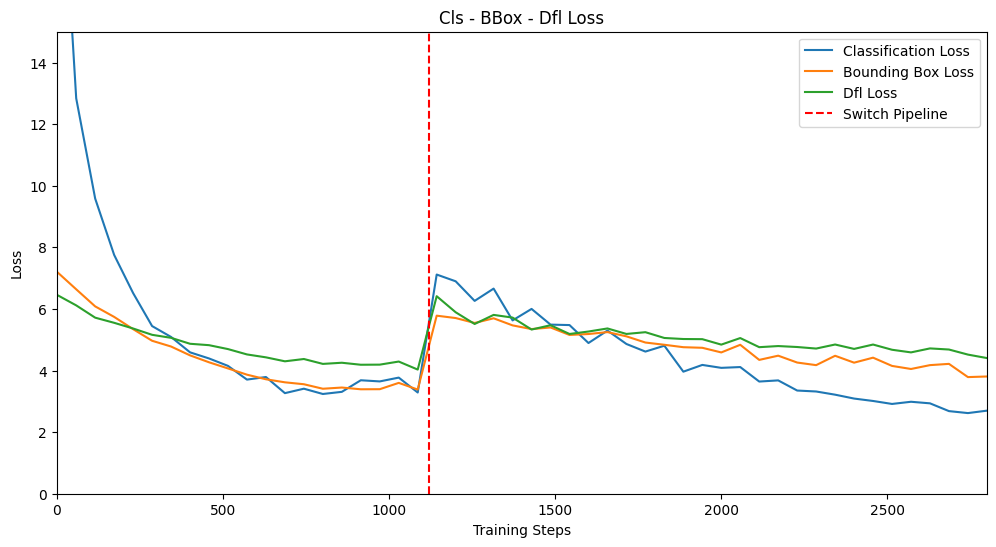

In [47]:
plot_training_loss(swith_epoch = 20, num_epoch = 50, steps_per_epoch=56)

# test after training with fine-tuned clip embeddings

In [106]:
runner = load_model_eval("yoloworld_tuned_image_embedding_weight.pth", "MLCV_configs/tuning_yolo_world/mlcv_yolo_world_zeroshot_config.py")

11/10 12:59:57 - mmengine - WARNING - Failed to search registry with scope "mmyolo" in the "log_processor" registry tree. As a workaround, the current "log_processor" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmyolo" is a correct scope, or whether the registry is initialized.
11/10 12:59:57 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.19 (default, Mar 20 2024, 19:58:24) [GCC 11.2.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1004295207
    GPU 0: NVIDIA GeForce RTX 2070 SUPER
    GPU 1: NVIDIA GeForce GTX 1080
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.2, V11.2.142
    GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.2) 9.4.0
    PyTorch: 1.11.0+cu113
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Int

11/10 13:00:00 - mmengine - INFO - Distributed training is not used, all SyncBatchNorm (SyncBN) layers in the model will be automatically reverted to BatchNormXd layers if they are used.
11/10 13:00:00 - mmengine - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(BELOW_NORMAL) LoggerHook                         
 -------------------- 
after_load_checkpoint:
(49          ) EMAHook                            
 -------------------- 
before_train:
(9           ) YOLOv5ParamSchedulerHook           
(VERY_HIGH   ) RuntimeInfoHook                    
(49          ) EMAHook                            
(NORMAL      ) IterTimerHook                      
(VERY_LOW    ) CheckpointHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) RuntimeInfoHook                    
(NORMAL      ) IterTimerHook                      
(NORMAL      ) DistSamplerSeedHo

In [38]:
runner.test()

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
11/08 16:29:41 - mmengine - INFO - Epoch(test) [ 50/501]    eta: 0:00:13  time: 0.0305  data_time: 0.0023  memory: 1850  
11/08 16:29:42 - mmengine - INFO - Epoch(test) [100/501]    eta: 0:00:11  time: 0.0279  data_time: 0.0002  memory: 1613  
11/08 16:29:44 - mmengine - INFO - Epoch(test) [150/501]    eta: 0:00:10  time: 0.0280  data_time: 0.0002  memory: 1613  
11/08 16:29:45 - mmengine - INFO - Epoch(test) [200/501]    eta: 0:00:08  time: 0.0278  data_time: 0.0002  memory: 1613  
11/08 16:29:47 - mmengine - INFO - Epoch(test) [250/501]    eta: 0:00:07  time: 0.0279  data_time: 0.0002  memory: 1613  
11/08 16:29:48 - mmengine - INFO - Epoch(test) [300/501]    eta: 0:00:05  time: 0.0280  data_time: 0.0002  memory: 1613  
11/08 16:29:49 - mmengine - INFO - Epoch(test) [350/501]    eta: 0:00:04  time: 0.0282  data_time: 0.0

{'coco/camping car_precision': 0.575,
 'coco/car_precision': 0.191,
 'coco/pickup_precision': 0.285,
 'coco/truck_precision': 0.425,
 'coco/van_precision': 0.096,
 'coco/bbox_mAP': 0.315,
 'coco/bbox_mAP_50': 0.469,
 'coco/bbox_mAP_75': 0.367,
 'coco/bbox_mAP_s': 0.001,
 'coco/bbox_mAP_m': 0.259,
 'coco/bbox_mAP_l': 0.372}

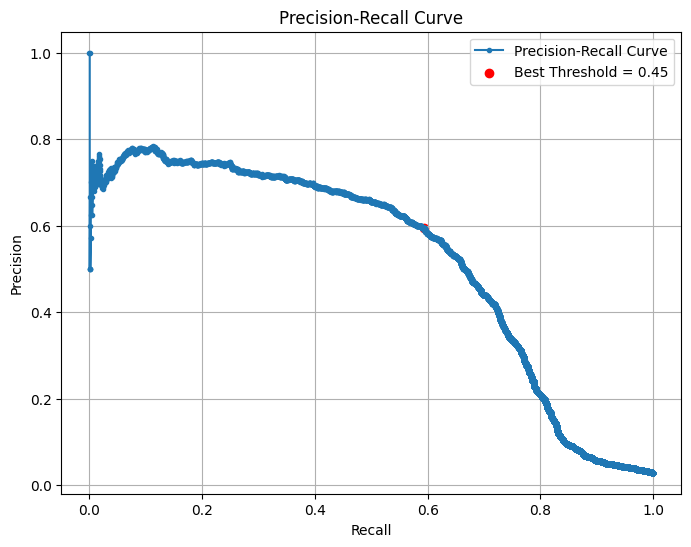

Best Confidence Threshold: 0.45
Best F1 Score: 0.59


In [108]:
plot_precision_recall_curve(runner, 
                            "vehicle_detection_satellite_coco/final_images", 
                            "vehicle_detection_satellite_coco/final_annotations.json")

SOME EXAMPLE DETECTION RESULTS W/ FINE_TUNED IMAGE QUERY AFTER TRAINING
---------------------------------------------------------------


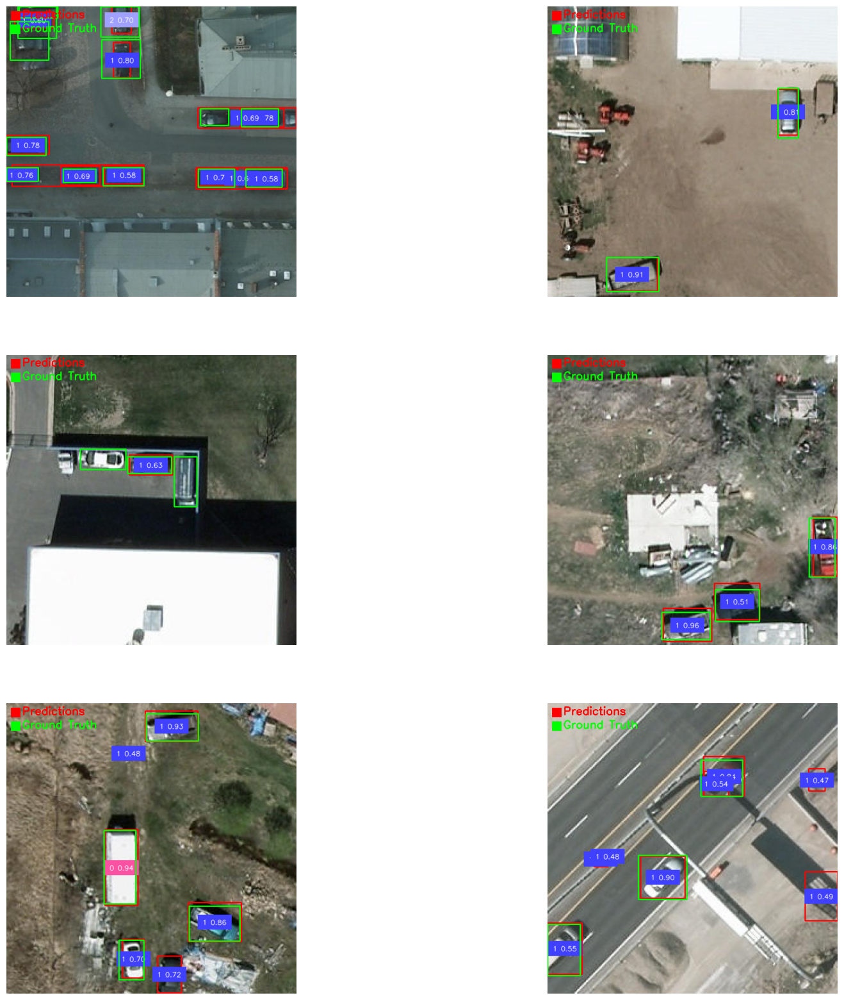

In [112]:
plot_sample_detections("vehicle_detection_satellite_coco/final_annotations.json", 
                       "vehicle_detection_satellite_coco/final_images", 0.45, 
                       "SOME EXAMPLE DETECTION RESULTS W/ FINE_TUNED IMAGE QUERY AFTER TRAINING")